<div style="position:relative; width:100%;">
  <!-- Logo absoluto en la esquina superior derecha (encima del título) -->
  <img src="../assets/OsGeolab.png"
       alt="Logo semillero"
       style="position:absolute; top:0; right:0; width:200px; z-index:50; pointer-events:none;">
    <img src="../assets/Ud.png"
       alt="Logo ud"
       style="position:absolute; top:0; left:0; width:100px; z-index:50; pointer-events:none;">
  <!-- Título centrado; le damos padding-top para que el logo pueda quedar encima -->
  <h2 style="text-align:center; margin:0; padding-top:100px;">
    Estudio de viabilidad en la delimitación de coberturas con imágenes satelitales mediante el modelo Segment Anything: Comparación con la metodología CORINE Land Cover en el municipio de Guatavita.
  </h2>
</div>

<h2 style="text-align:center;" >Tutorial generacion de teselas</h2>

Autores:
*   **Cristian Stiven Florez Macias**
*   **Sergio Andres Escobar Eslava** 

##  Indice
1. [INSTALACIÓN DE PAQUETES](#packages)
2. [IMPORTAR PAQUETES](#import)
3. [GENERACION DE TESELAS](#auth)
4. [RECORTAR IMAGEN](#area)
4. [RECORTAR COBERTURA](#area)


<a name="packages"></a>

## 1. INSTALACIÓN DE PAQUETES

Para este proyecto es necesario el uso de paquetes, por lo caul se hace uso del comando `pip install` si observamos se le agrega un `!` para ejecutar la linea de codigo sobre la terminal del sistema o `%` para ejecutar el administrador de paquetes pip dentro del kernel actual, lo anterior con el fin de instalar paquetes externos que aportan diversas funciones dentro del proyecto para este caso son:

* **tqdm**: Es un paquete de Python que proporciona barras de progreso visuales para bucles e iteraciones, se usa en el proyecto para hacer visible procesos como la generación de teselas.
* **Numpy**: Es un paquete que proporciona soporte para arrays de varias dimensiones y operaciones matemáticas de alto rendimiento, en el proyecto se usa para eliminar partes de imágenes vacías. 
* **shapely**: Es un paquete de python, es usado en el proyecto para generar las cajas donde se van a representar los tiles.
* **Geopandas**: Es un paquete de python de código abierto pensado para facilitar las operaciones con tipos geometricos (Punto, Multi-punto, Linea, Multi-linea, Polígono y Multi-poligono).
* **Rasterio**: Es un paquete de python de código abierto que facilita la lectura y escritura de formatos para almacenar datos raster mediante una API de python que se apoya en matrices N-dimensionales y geojson.
* **eeconvert**: Es un paquete en python aun en version pre alpha que se usa para realizar conversiones desde formatos empleados em Google Earth Engine a formatos SIG como GeoDataframes, es importante en el proyecto para convertir la region de un archivo GeoDataFrame a un archivo compatible con EarthEngine como featureCollection.

In [1]:
%pip install -q tqdm pandas numpy geopandas rasterio shapely

Note: you may need to restart the kernel to use updated packages.


## 2. IMPORTAR PAQUETES

Los paquetes en python son una opción para estructurar los módulos realizados en python, nos permite cargar un "módulo A.B designa un submódulo B en un paquete llamado A."(pythondocs, s.f) por ejemplo tomamos el multimodulo a: tqdm con su modulo b: notebook y le designamos un submodulo tqdm, esto nos da la posibilidad de no preocuparnos por nombres duplicados en nuestro proyecto.

In [2]:
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
import geopandas as gpd
import rasterio as rio
import matplotlib.pyplot as plt
from rasterio import mask
from rasterio.plot import show
from shapely.geometry import box
import os

## 3. GENERAR TESELAS

Se genera primero una malla la cual va a contener la información georeferenciada de la zona de estudio, el suo de teselas ayuda a mejorar el rendimiento de distintos procesos, para nuestro caso el de evaluar por partes el modelo SAM.

In [6]:
def generate_tiles(image_file, output_file, area_str, size=64):
    """Genera teselas por defecto en polígonos de 64 x 64.

    Args:
      image_file (str): Ruta del archivo de imagen (.tif)
      output_file (str): Ruta del archivo de salida (.geojson)
      area_str (str): Nombre de la región
      size (int): Tamaño de la ventana

    Returns:
      GeoPandas DataFrame: Contiene las teselas poligonales de 64 x 64
    """

    # Abre la imagen ráster usando rasterio
    raster = rio.open(image_file)
    width, height = raster.shape

    # Crea un diccionario que contendrá nuestras teselas poligonales de 64 x 64 px
    # Más tarde convertiremos este diccionario en un DataFrame de GeoPandas.
    geo_dict = {'id': [], 'geometry': []}
    index = 0

    # Realiza un desplazamiento de ventana deslizante sobre la imagen ráster
    with tqdm(total=width * height) as pbar:
        for w in range(0, width, size):
            for h in range(0, height, size):
                # Crea una ventana del tamaño deseado
                window = rio.windows.Window(h, w, size, size)
                # Obtén los límites georreferenciados de la ventana
                bbox = rio.windows.bounds(window, raster.transform)
                # Crea una geometría de shapely a partir del cuadro delimitador
                bbox = box(*bbox)

                # Crea un identificador único para cada geometría
                uid = '{}-{}'.format(area_str.lower().replace(' ', '_'), index)

                # Actualiza el diccionario
                geo_dict['id'].append(uid)
                geo_dict['geometry'].append(bbox)

                index += 1
                pbar.update(size * size)

    # Convierte el diccionario en un DataFrame de GeoPandas
    results = gpd.GeoDataFrame(pd.DataFrame(geo_dict))
    # Establece el CRS a EPSG:4326
    results.crs = {'init': 'epsg:4326'}
    # Guarda el archivo como GeoJSON
    results.to_file(output_file, driver="GeoJSON")

    raster.close()
    return results

A continuación generamos las teselas para la zona de estudio de Guatavita, dividimos la imagen en cuadros georeferenciados de dimensiones 256x256, ademas se guardan estas teselas para hacer mas simple el proceso de carga y no manejar todo en memoria RAM.

In [7]:
tif_file='../tiff/sentinel_guatavita_realzada.tif'
output_file = os.path.join("../tiles", '{}.geojson'.format('gautavita'))
tiles = generate_tiles(tif_file, output_file, 'gautavita', size=256)

  0%|          | 0/4589795 [00:00<?, ?it/s]

c:\Users\Cristian\Desktop\Trabajos U\DEFINITIVO-Proyecto de grado\.venv\Lib\site-packages\pyproj\crs\crs.py:143: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


A continuación visualizamos la distribución de las teselas en la imagen, validando si es el resultado deseado.

C:\Users\Cristian\AppData\Local\Temp\ipykernel_23168\2018384762.py:5: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=epsg:4326 +type=crs
Right CRS: EPSG:4326

  tiles = gpd.sjoin(tiles, boundary, predicate='within')


<Axes: >

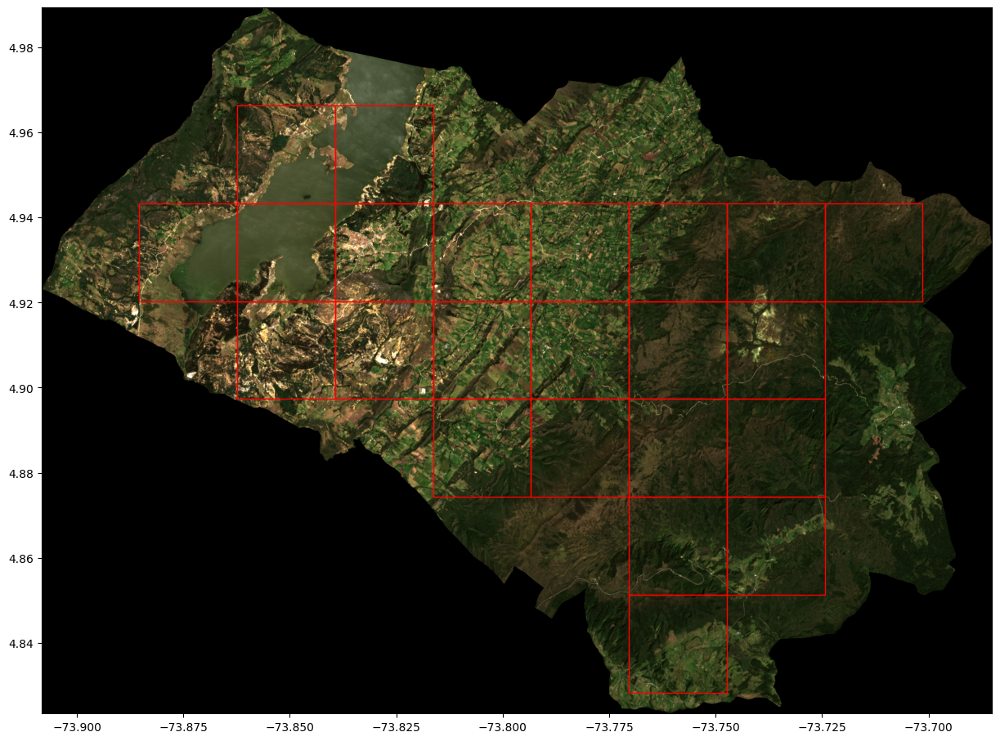

In [5]:
image = rio.open(tif_file)
boundary = gpd.read_file('../geojson/guatavita.geojson')

# Geopandas funcion sjoin
tiles = gpd.sjoin(tiles, boundary, predicate='within')

fig, ax = plt.subplots(figsize=(15,15))
tiles.plot(facecolor="none", edgecolor='red', ax=ax)
show(image, ax=ax)

## Recorte de la imagen satelital

Esta sección del código recorta la imagen satelital completa en múltiples teselas individuales de 256×256 píxeles y las guarda como archivos GeoTIFF separados. La función generate_crop_raster toma cada polígono de la malla de teselas generada previamente, extrae la porción correspondiente de la imagen original, elimina los bordes vacíos (píxeles negros) usando NumPy, y guarda cada recorte con su información geoespacial preservada. El bucle final itera sobre todas las teselas y genera archivos individuales (Guatavita_0_crop.tif, Guatavita_1_crop.tif, etc.) en la carpeta ../tiles/Sentinel/, permitiendo procesar la imagen por partes en lugar de cargar toda la imagen en memoria, lo cual es esencial para aplicar el modelo SAM de manera eficiente.

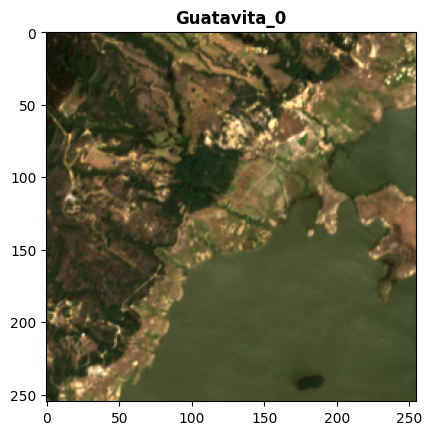

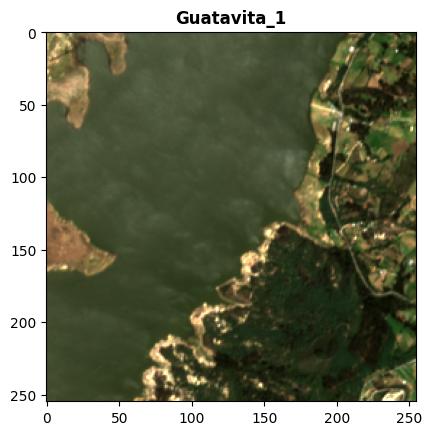

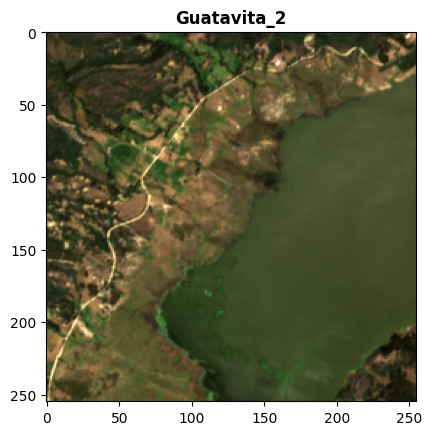

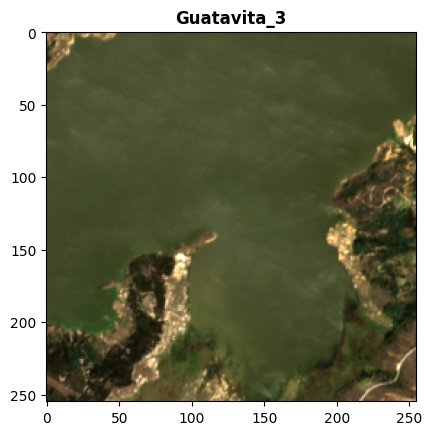

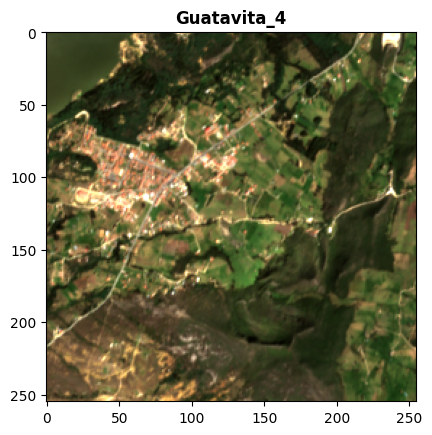

...

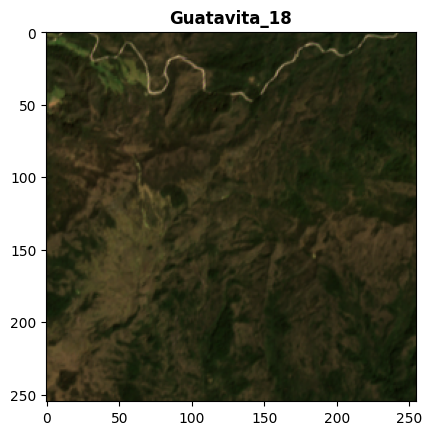

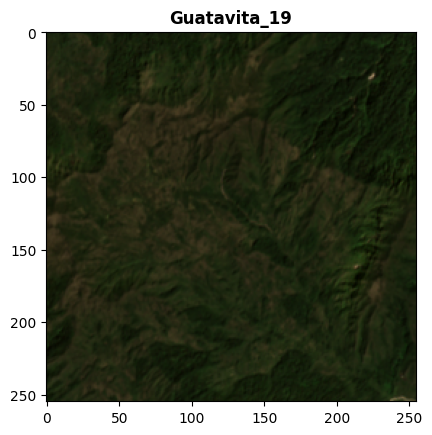

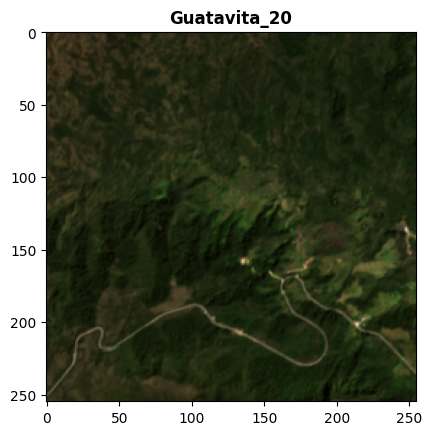

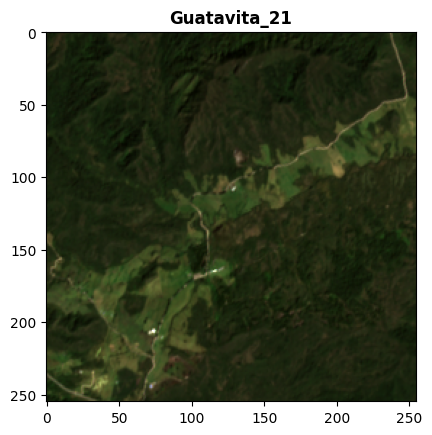

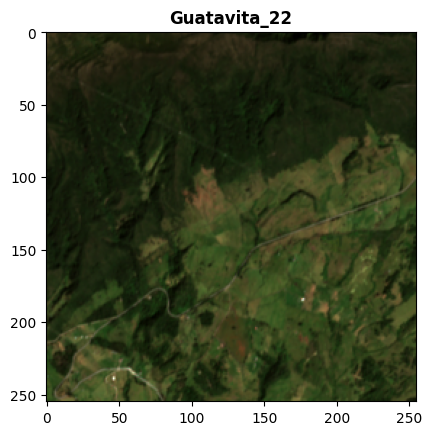

In [17]:
def generate_crop_raster(image, shape, title='', output_dir=''):
  """Recorta una imagen según la forma del polígono y guarda el resultado en la carpeta especificada.
  Referencia: https://rasterio.readthedocs.io/en/latest/api/rasterio.mask.html#rasterio.mask.mask

  Args:
    image (str): Ruta del archivo de imagen (.tif)
    shape (geometry): El mosaico con el que recortar la imagen
    title(str): Titulo de la imagen
    output_dir (str): Carpeta donde guardar el recorte
  """

  os.makedirs(output_dir, exist_ok=True)
  with rio.open(image) as src:
      out_image, out_transform = mask.mask(src, shape, crop=True)
      # Recortar el borde negro (cero)
      _, x_nonzero, y_nonzero = np.nonzero(out_image)
      out_image = out_image[
        :,
        np.min(x_nonzero):np.max(x_nonzero),
        np.min(y_nonzero):np.max(y_nonzero)
      ]
      # Visualizar la imagen
      show(out_image, title=title)
      # Guardar el recorte
      out_meta = src.meta.copy()
      out_meta.update({
          "driver": "GTiff",
          "height": out_image.shape[1],
          "width": out_image.shape[2],
          "transform": out_transform
      })
      output_path = os.path.join(output_dir, f'{title}_crop.tif')
      with rio.open(output_path, "w", **out_meta) as dest:
          dest.write(out_image)

output_dir = '../tiles/Sentinel'
for i in range(len(tiles)):
    generate_crop_raster(tif_file, [tiles.iloc[i]['geometry']], title=f'Guatavita_{i}', output_dir=output_dir)

## Recorte de cobertura corine land cover

c:\Users\Cristian\Desktop\Trabajos U\DEFINITIVO-Proyecto de grado\.venv\Lib\site-packages\geopandas\plotting.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize)


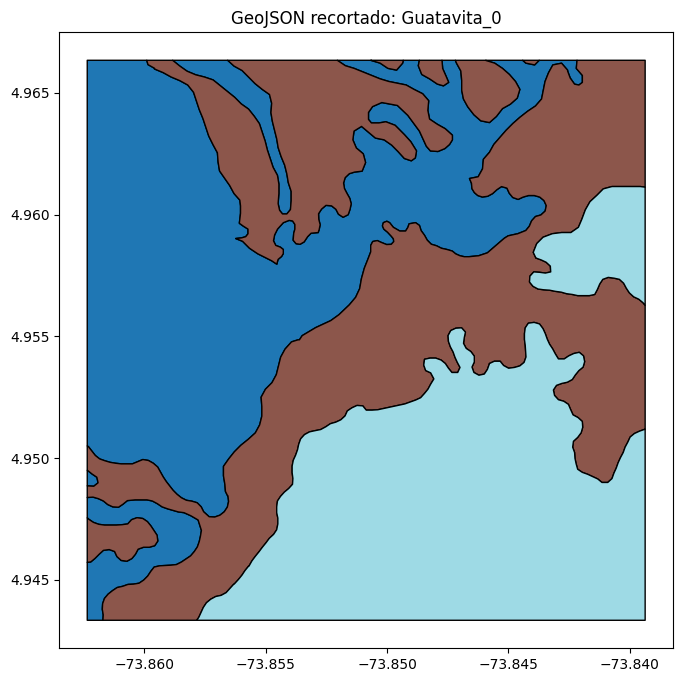

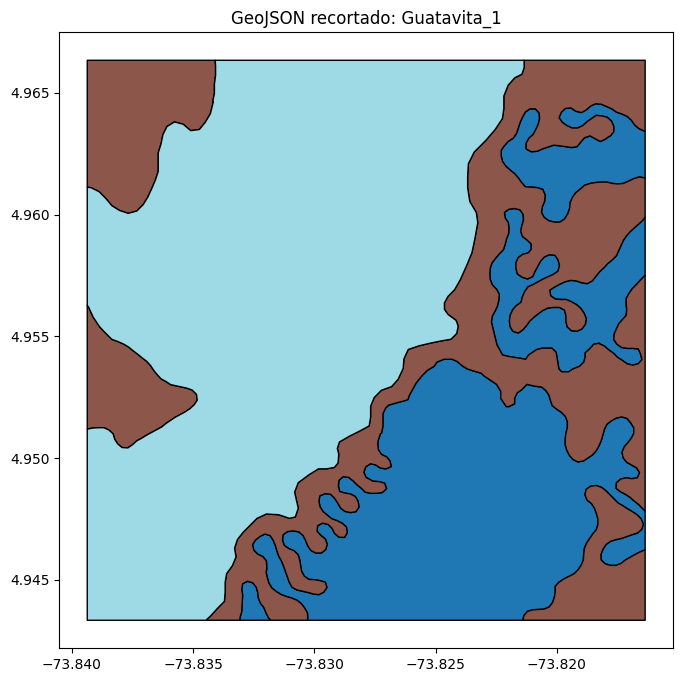

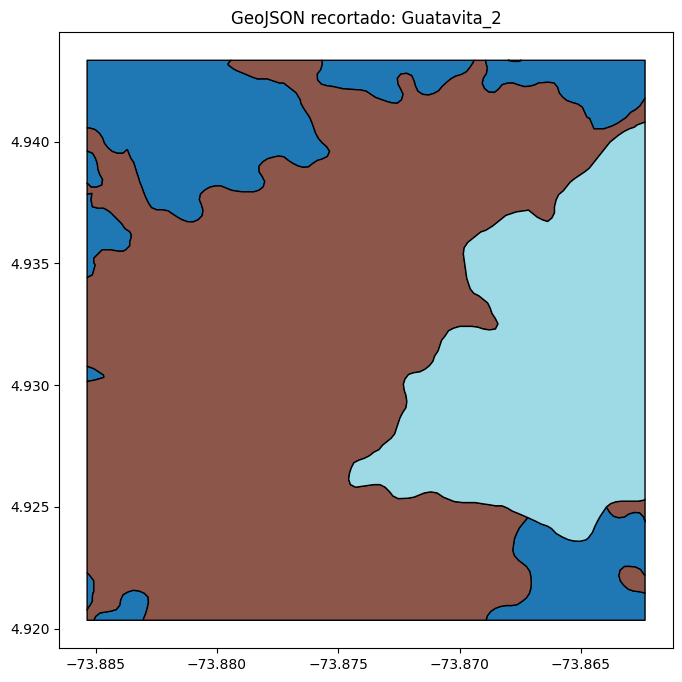

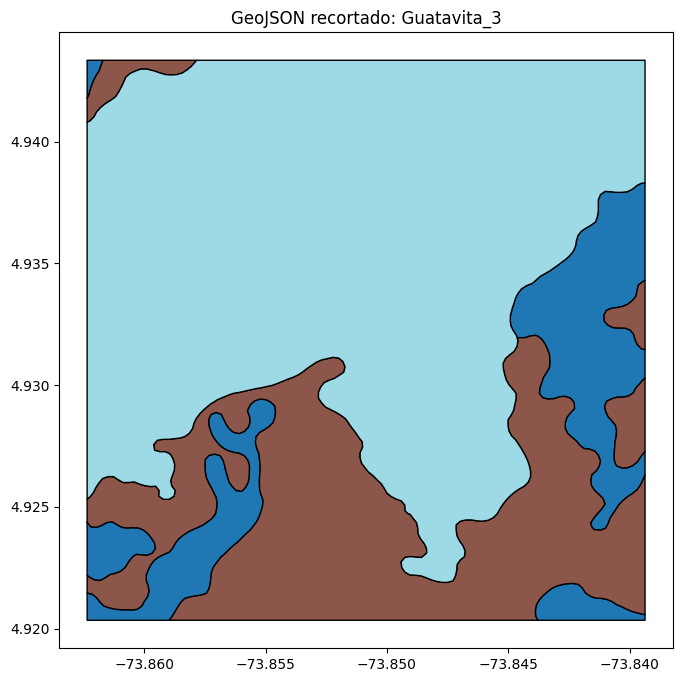

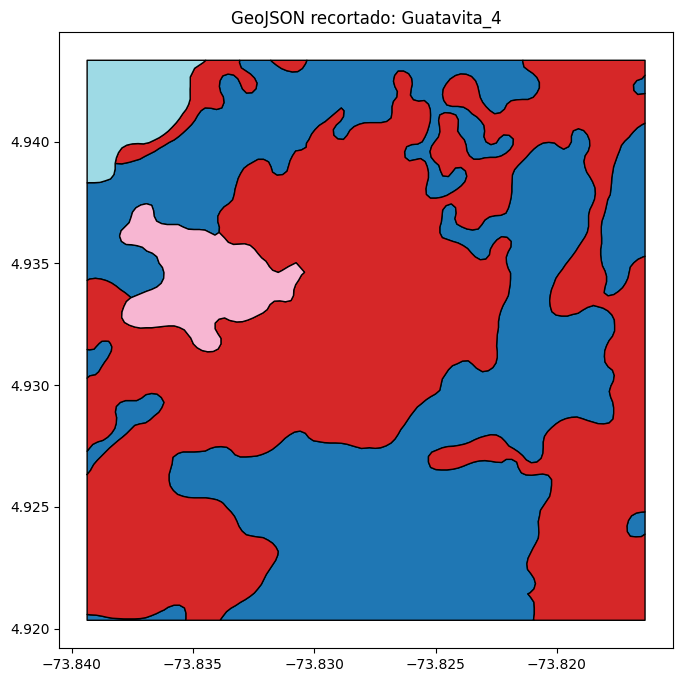

...

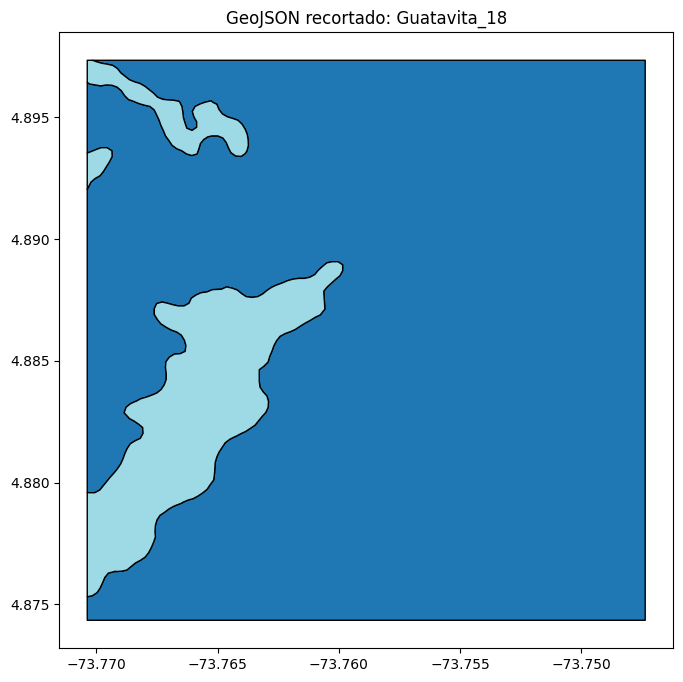

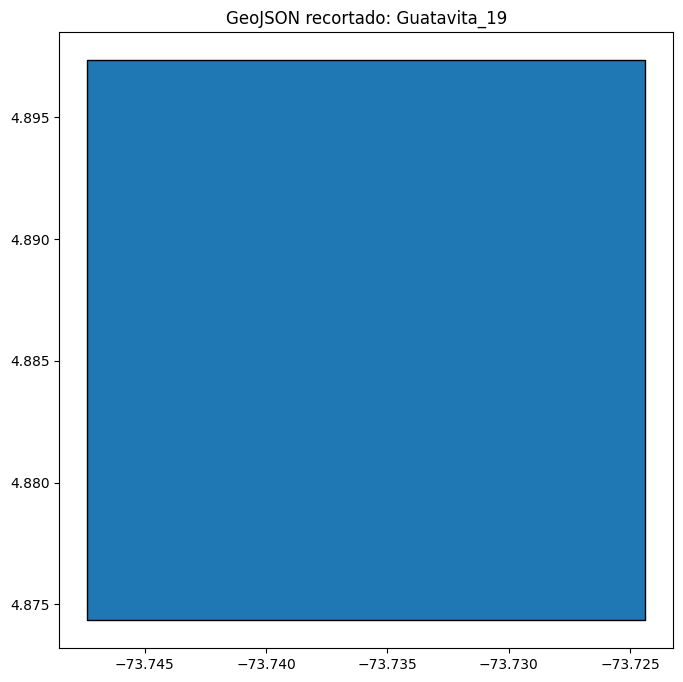

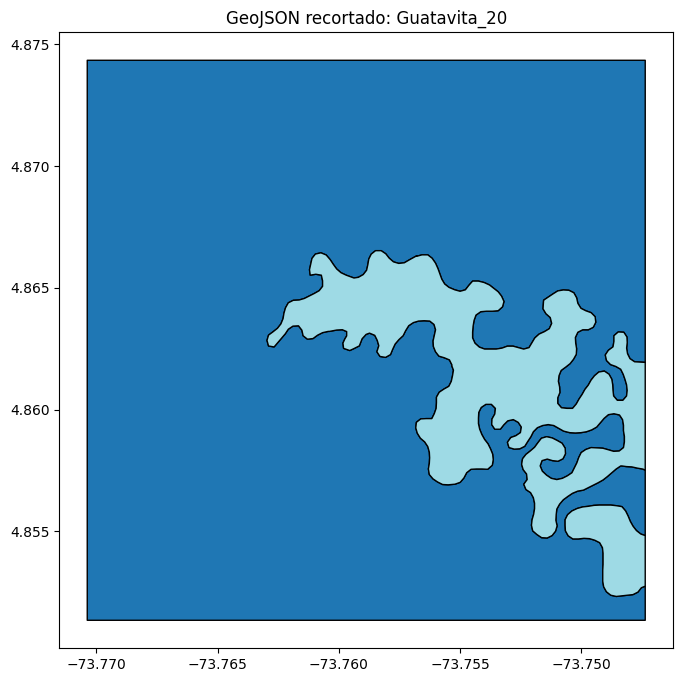

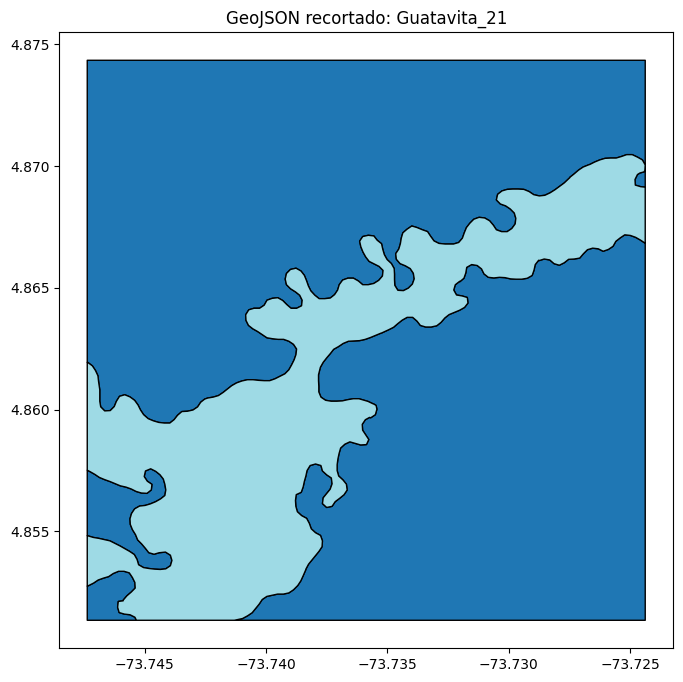

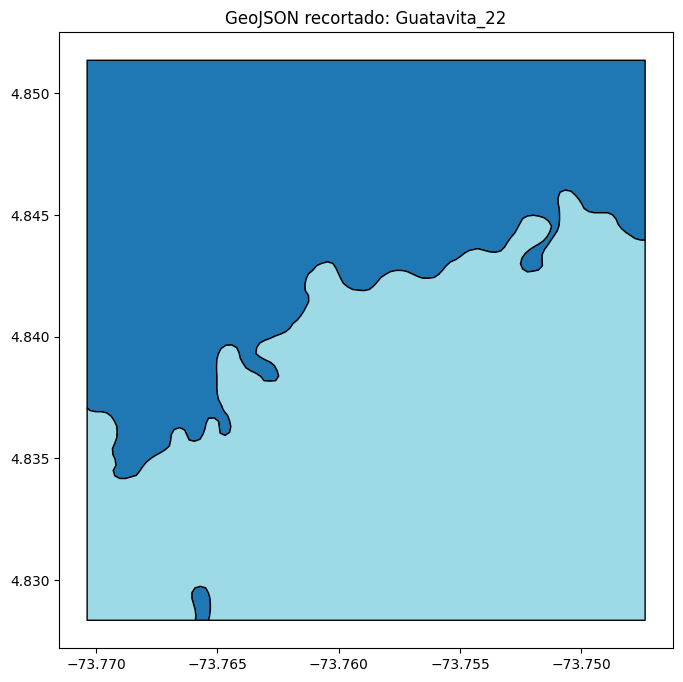

In [ ]:
def generate_crop_vector(landGeojson, shape, title='', output_dir=''):
  """Recorta un poligono en geojson de acuerdo al poligono de teselas y guarda el resultado en la carpeta de salida.

  Args:
    landGeojson (str): Ruta del archivo GeoJSON de la capa de uso del suelo
    shape (geometry): El mosaico con el que recortar la imagen
    title(str): Titulo de la imagen
    output_dir (str): Carpeta donde guardar el recorte
  """
  #Generar recorte
  os.makedirs(output_dir, exist_ok=True)
  land = gpd.read_file(landGeojson)
  out_shape = gpd.clip(land, shape)
  #guardar recorte
  output_path = os.path.join(output_dir, f'{title}_crop.geojson')
  # Ajustar colores y traer la funcion de generacion con salida grafica
  out_shape.to_file(output_path, driver="GeoJSON")
  ax = out_shape.plot( cmap='tab20', figsize=(8,8), edgecolor='black', linewidth=1, legend=True)
  ax.set_title(f'GeoJSON recortado: {title}')
  return out_shape

#Ejecucion de la funcion
landGeojson = '../geojson/landcoverLevel1.geojson'
output_dir = '../tiles/LandUse'

for i in range(len(tiles)):
   generate_crop_vector(landGeojson, tiles.iloc[i]['geometry'], title=f'Guatavita_{i}', output_dir=output_dir)